# Covid-19 Analysis

**By: Mukesh Ganesh**

**COVID-19 dataset is the most important data right now. It’s the basis of how we’re seeing and measuring the impact of this virus around the world.**

**This analysis will give you an idea of confirmed, recovered, death and active cases globally as well as countrywise. It will also give you an idea of how the virus has spread and the places most impacted by this pandemic**

**Analysis have been topped with interactive visualizations which gives us good insights on how things have folded across the globe** 

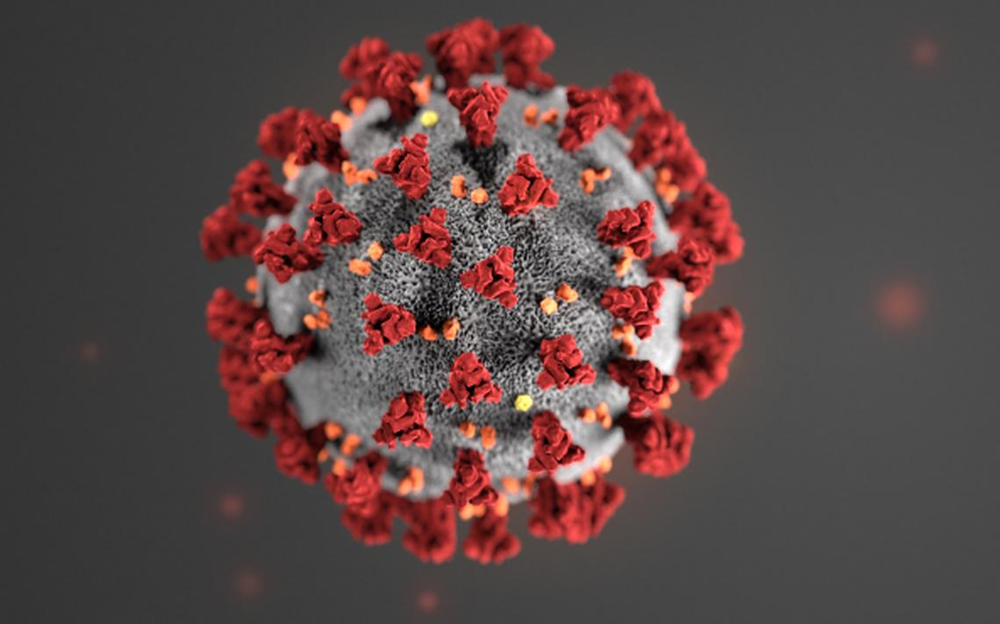

## Installs

* pip install pycountry_convert

**Library for getting continent name from their country names**
 
* pip install folium

**Used to visualize geospatial data in a Leaflet map**

* pip install calmap

**Used to visualize time series data sampled by day in a heatmap per calendar year**

## Import modules

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import ticker 
import pycountry_convert as pc
import folium
import branca
from datetime import datetime, timedelta,date
from scipy.interpolate import make_interp_spline, BSpline

# plotly for interative plots
import plotly.express as px 
import json, requests
import calmap

# Keras for Prediction Models
from keras.layers import Input, Dense, Activation, LeakyReLU, Dropout
from keras import models
from keras.optimizers import RMSprop, Adam

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

Using TensorFlow backend.


## Import data

**About the data**

* confirmed_global.csv : Contains the confirmed cases per day in every country from January 22nd to July 2nd

* deaths_global.csv : Contains the death cases per day in every country from January 22nd to July 2nd

* recovered_global.csv : Contains the recovered cases per day in every country from January 22nd to July 2nd

* cases_country.csv : Contains the details such as confirmed, deaths, recovered, active, incident rate, mortality rate per country until 2nd July

* cases_time.csv : Contains the details such as confirmed cases, death, incident rate per country per day

In [2]:
df_confirmed = pd.read_csv('confirmed_global.csv')
df_deaths = pd.read_csv('deaths_global.csv')
df_recovered = pd.read_csv('recovered_global.csv')

df_covid19 = pd.read_csv("cases_country.csv")

df_table = pd.read_csv("https://raw.githubusercontent.com/CSSEGISandData/COVID-19/web-data/data/cases_time.csv",\
                       parse_dates=['Last_Update'])

In [3]:
df_confirmed.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,29481,29640,30175,30451,30616,30967,31238,31517,31836,32022
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,2047,2114,2192,2269,2330,2402,2466,2535,2580,2662
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,12076,12248,12445,12685,12968,13273,13571,13907,14272,14657
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,855,855,855,855,855,855,855,855,855,855
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,189,197,212,212,259,267,276,284,291,315


In [4]:
df_deaths.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,618,639,675,683,703,721,733,746,774,807
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,45,47,49,51,53,55,58,62,65,69
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,861,869,878,885,892,897,905,912,920,928
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,52,52,52,52,52,52,52,52,52,52
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,10,10,10,10,10,11,11,13,15,17


In [5]:
df_recovered.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20
0,NaN,Afghanistan,33.0000,65.0000,0,0,0,0,0,0,...,9260,9869,10174,10306,10674,12604,13934,14131,15651,16041
1,NaN,Albania,41.1533,20.1683,0,0,0,0,0,0,...,1195,1217,1250,1298,1346,1384,1438,1459,1516,1559
2,NaN,Algeria,28.0339,1.6596,0,0,0,0,0,0,...,8674,8792,8920,9066,9202,9371,9674,9897,10040,10342
3,NaN,Andorra,42.5063,1.5218,0,0,0,0,0,0,...,797,797,797,799,799,799,799,799,799,800
4,NaN,Angola,-11.2027,17.8739,0,0,0,0,0,0,...,77,77,81,81,81,81,93,93,97,97


In [6]:
df_covid19.head()

,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Incident_Rate,People_Tested,People_Hospitalized,Mortality_Rate,UID,ISO3
0,Australia,03-07-2020 23:35,-25.0000,133.0000,8255,104,7320.0,831,32.423791,NaN,NaN,1.259843,36,AUS
1,Austria,03-07-2020 23:35,47.5162,14.5501,18050,705,16558.0,787,200.413040,NaN,NaN,3.905817,40,AUT
2,Canada,03-07-2020 23:35,60.0010,-95.0010,106896,8721,70200.0,27976,282.377540,NaN,NaN,8.158397,124,CAN
3,China,03-07-2020 23:35,30.5928,114.3055,84835,4641,79670.0,524,6.039470,NaN,NaN,5.470619,156,CHN
4,Denmark,03-07-2020 23:35,56.2639,9.5018,13032,606,12017.0,409,224.992114,NaN,NaN,4.650092,208,DNK


In [7]:
df_table.head()

,Country_Region,Last_Update,Confirmed,Deaths,Recovered,Active,Delta_Confirmed,Delta_Recovered,Incident_Rate,People_Tested,People_Hospitalized,Province_State,FIPS,UID,iso3,Report_Date_String
0,Afghanistan,2020-01-22,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/22
1,Afghanistan,2020-01-23,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/23
2,Afghanistan,2020-01-24,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/24
3,Afghanistan,2020-01-25,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/25
4,Afghanistan,2020-01-26,0,0,NaN,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,4,AFG,2020/01/26


## Preprocessing data

**Dropping few columns from df_covid19 since they are full of NAN and irrelevant**

In [8]:
df_covid19 = df_covid19.drop(["People_Tested","People_Hospitalized","UID","ISO3","Mortality_Rate"], axis = 1)
df_covid19.head()

,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Incident_Rate
0,Australia,03-07-2020 23:35,-25.0000,133.0000,8255,104,7320.0,831,32.423791
1,Austria,03-07-2020 23:35,47.5162,14.5501,18050,705,16558.0,787,200.413040
2,Canada,03-07-2020 23:35,60.0010,-95.0010,106896,8721,70200.0,27976,282.377540
3,China,03-07-2020 23:35,30.5928,114.3055,84835,4641,79670.0,524,6.039470
4,Denmark,03-07-2020 23:35,56.2639,9.5018,13032,606,12017.0,409,224.992114


**Changing column names**

In [9]:
df_confirmed = df_confirmed.rename(columns = {'Province/State' : 'state', 'Country/Region' : 'country'})
df_deaths = df_deaths.rename(columns = {'Province/State' : 'state', 'Country/Region' : 'country'})
df_recovered = df_recovered.rename(columns = {'Province/State' : 'state', 'Country/Region' : 'country'})
df_covid19 = df_covid19.rename(columns={"Country_Region": "country"})

In [10]:
df_recovered.columns

Index(['state', 'country', 'Lat', 'Long', '1/22/20', '1/23/20', '1/24/20',
       '1/25/20', '1/26/20', '1/27/20',
       ...
       '6/23/20', '6/24/20', '6/25/20', '6/26/20', '6/27/20', '6/28/20',
       '6/29/20', '6/30/20', '7/1/20', '7/2/20'],
      dtype='object', length=167)

In [11]:
df_covid19.columns

Index(['country', 'Last_Update', 'Lat', 'Long_', 'Confirmed', 'Deaths',
       'Recovered', 'Active', 'Incident_Rate'],
      dtype='object')

**Adding a column called 'Active'to show the cases which are currently active**

In [12]:
df_covid19["Active"] = df_covid19["Confirmed"] - df_covid19["Recovered"] - df_covid19["Deaths"]

In [13]:
df_covid19.columns

Index(['country', 'Last_Update', 'Lat', 'Long_', 'Confirmed', 'Deaths',
       'Recovered', 'Active', 'Incident_Rate'],
      dtype='object')

**Changing the country names as required by pycountry_convert Lib**

In [14]:
df_confirmed.country.unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Benin', 'Bhutan', 'Bolivia',
       'Bosnia and Herzegovina', 'Brazil', 'Brunei', 'Bulgaria',
       'Burkina Faso', 'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada',
       'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia',
       'Congo (Brazzaville)', 'Congo (Kinshasa)', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Diamond Princess', 'Cuba', 'Cyprus',
       'Czechia', 'Denmark', 'Djibouti', 'Dominican Republic', 'Ecuador',
       'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon',
       'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece', 'Guatemala',
       'Guinea', 'Guyana', 'Haiti', 'Holy See', 'Honduras', 'Hungary',
       'Iceland', 'India

In [15]:
df_deaths.country.unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Benin', 'Bhutan', 'Bolivia',
       'Bosnia and Herzegovina', 'Brazil', 'Brunei', 'Bulgaria',
       'Burkina Faso', 'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada',
       'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia',
       'Congo (Brazzaville)', 'Congo (Kinshasa)', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Diamond Princess', 'Cuba', 'Cyprus',
       'Czechia', 'Denmark', 'Djibouti', 'Dominican Republic', 'Ecuador',
       'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia',
       'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France', 'Gabon',
       'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece', 'Guatemala',
       'Guinea', 'Guyana', 'Haiti', 'Holy See', 'Honduras', 'Hungary',
       'Iceland', 'India

In [16]:
df_recovered.country.unique()

array(['Afghanistan', 'Albania', 'Algeria', 'Andorra', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Australia',
       'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh',
       'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia', 'Bosnia and Herzegovina', 'Brazil', 'Brunei',
       'Bulgaria', 'Burkina Faso', 'Cabo Verde', 'Cambodia', 'Cameroon',
       'Canada', 'Central African Republic', 'Chad', 'Chile', 'China',
       'Colombia', 'Congo (Brazzaville)', 'Congo (Kinshasa)',
       'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Diamond Princess',
       'Cuba', 'Cyprus', 'Czechia', 'Denmark', 'Djibouti', 'Dominica',
       'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador',
       'Equatorial Guinea', 'Eritrea', 'Estonia', 'Eswatini', 'Ethiopia',
       'Fiji', 'Finland', 'France', 'Gabon', 'Gambia', 'Georgia',
       'Germany', 'Ghana', 'Grenada', 'Greece', 'Guatemala', 'Guinea',
       'Guinea-Bissau', 'Guyana', 'Haiti', 'H

**Some of the country names need to be changed as per the pycountry_convert Lib**

In [17]:
# USA
df_confirmed.loc[df_confirmed['country'] == "US", "country"] = "USA"
df_deaths.loc[df_deaths['country'] == "US", "country"] = "USA"
df_recovered.loc[df_recovered['country'] == "US", "country"] = "USA"
df_covid19.loc[df_covid19['country'] == "US", "country"] = "USA"
df_table.loc[df_table['Country_Region'] == "US", "Country_Region"] = "USA"

# South Korea
df_confirmed.loc[df_confirmed['country'] == 'Korea, South', "country"] = 'South Korea'
df_deaths.loc[df_deaths['country'] == 'Korea, South', "country"] = 'South Korea'
df_recovered.loc[df_recovered['country'] == 'Korea, South', "country"] = 'South Korea'
df_covid19.loc[df_covid19['country'] == "Korea, South", "country"] = "South Korea"
df_table.loc[df_table['Country_Region'] == "Korea, South", "Country_Region"] = "South Korea"

# Taiwan
df_confirmed.loc[df_confirmed['country'] == 'Taiwan*', "country"] = 'Taiwan'
df_deaths.loc[df_deaths['country'] == 'Taiwan*', "country"] = 'Taiwan'
df_recovered.loc[df_recovered['country'] == 'Taiwan*', "country"] = 'Taiwan'
df_covid19.loc[df_covid19['country'] == "Taiwan*", "country"] = "Taiwan"
df_table.loc[df_table['Country_Region'] == "Taiwan*", "Country_Region"] = "Taiwan"

# Democratic Republic of the Congo
df_confirmed.loc[df_confirmed['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'
df_deaths.loc[df_deaths['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'
df_recovered.loc[df_recovered['country'] == 'Congo (Kinshasa)', "country"] = 'Democratic Republic of the Congo'
df_covid19.loc[df_covid19['country'] == "Congo (Kinshasa)", "country"] = "Democratic Republic of the Congo"
df_table.loc[df_table['Country_Region'] == "Congo (Kinshasa)", "Country_Region"] = "Democratic Republic of the Congo"

# Republic of the Congo
df_confirmed.loc[df_confirmed['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'
df_deaths.loc[df_deaths['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'
df_recovered.loc[df_recovered['country'] == 'Congo (Brazzaville)', "country"] = 'Republic of the Congo'
df_covid19.loc[df_covid19['country'] == "Congo (Brazzaville)", "country"] = "Republic of the Congo"
df_table.loc[df_table['Country_Region'] == "Congo (Brazzaville)", "Country_Region"] = "Republic of the Congo"

**Getting all countries into an array**

**Since country names are similar in all the 3 files, confirmed, death and recovered, lets store them in 1 single variable called countries**

In [18]:
countries1 = np.asarray(df_confirmed["country"])
countries2 = np.asarray(df_deaths["country"])
countries3 = np.asarray(df_recovered["country"])
countries4 = np.asarray(df_covid19["country"])

**Defining continent code**

In [19]:
continents = {
    'NA': 'North America',
    'SA': 'South America', 
    'AS': 'Asia',
    'OC': 'Australia',
    'AF': 'Africa',
    'EU' : 'Europe',
    'na' : 'Others'
}

**Defininng Function for getting continent code for country.**

In [20]:
def country_to_continent_code(country):
    try:
        return pc.country_alpha2_to_continent_code(pc.country_name_to_country_alpha2(country))
    except :
        return 'na'

**Inserting continent column in all the datasets**

In [21]:
df_confirmed.insert(2,"continent", [continents[country_to_continent_code(country)] for country in countries1[:]])
df_deaths.insert(2,"continent",  [continents[country_to_continent_code(country)] for country in countries2[:]])
df_recovered.insert(2,"continent",  [continents[country_to_continent_code(country)] for country in countries3[:]])
df_covid19.insert(1,"continent",  [continents[country_to_continent_code(country)] for country in countries4[:]])
df_table.insert(1,"continent",  [continents[country_to_continent_code(country)] for country in df_table["Country_Region"].values])

**Making countries that do not belong to any of the continents as others**

In [22]:
df_table = df_table[df_table["continent"] != "Others"]

In [23]:
df_confirmed[df_deaths["continent"] == 'Others']

,state,country,continent,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20
86,NaN,Cote d'Ivoire,Others,7.540000,-5.547100,0,0,0,0,0,...,7904,8164,8334,8739,8944,9101,9214,9499,9702,9992
88,NaN,Diamond Princess,Others,0.000000,0.000000,0,0,0,0,0,...,712,712,712,712,712,712,712,712,712,712
127,NaN,Holy See,Others,41.902900,12.453400,0,0,0,0,0,...,12,12,12,12,12,12,12,12,12,12
236,NaN,Timor-Leste,Others,-8.874217,125.727539,0,0,0,0,0,...,24,24,24,24,24,24,24,24,24,24
240,NaN,West Bank and Gaza,Others,31.952200,35.233200,0,0,0,0,0,...,1169,1328,1382,1557,1815,1990,2185,2428,2758,3080
246,NaN,Kosovo,Others,42.602636,20.902977,0,0,0,0,0,...,2169,2169,2169,2169,2169,2169,2677,2878,2991,3064
247,NaN,Burma,Others,21.916200,95.956000,0,0,0,0,0,...,292,293,293,293,296,299,299,299,303,304
251,NaN,MS Zaandam,Others,0.000000,0.000000,0,0,0,0,0,...,9,9,9,9,9,9,9,9,9,9
260,NaN,Western Sahara,Others,24.215500,-12.885800,0,0,0,0,0,...,10,10,10,10,10,10,10,10,10,10


In [24]:
df_deaths[df_deaths["continent"] == 'Others']

,state,country,continent,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20
86,NaN,Cote d'Ivoire,Others,7.540000,-5.547100,0,0,0,0,0,...,58,58,60,64,66,66,66,68,68,68
88,NaN,Diamond Princess,Others,0.000000,0.000000,0,0,0,0,0,...,13,13,13,13,13,13,13,13,13,13
127,NaN,Holy See,Others,41.902900,12.453400,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
236,NaN,Timor-Leste,Others,-8.874217,125.727539,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
240,NaN,West Bank and Gaza,Others,31.952200,35.233200,0,0,0,0,0,...,3,3,3,3,4,4,5,8,8,9
246,NaN,Kosovo,Others,42.602636,20.902977,0,0,0,0,0,...,37,37,37,37,37,37,49,51,54,55
247,NaN,Burma,Others,21.916200,95.956000,0,0,0,0,0,...,6,6,6,6,6,6,6,6,6,6
251,NaN,MS Zaandam,Others,0.000000,0.000000,0,0,0,0,0,...,2,2,2,2,2,2,2,2,2,2
260,NaN,Western Sahara,Others,24.215500,-12.885800,0,0,0,0,0,...,1,1,1,1,1,1,1,1,1,1


In [25]:
df_recovered[df_deaths["continent"] == 'Others']

,state,country,continent,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20
86,NaN,Djibouti,Africa,11.825100,42.590300,0,0,0,0,0,...,3989,4182,4269,4348,4348,4348,4433,4524,4550,4564
88,NaN,Dominican Republic,North America,18.735700,-70.162700,0,0,0,0,0,...,15551,16006,16223,16357,16666,17142,17280,17580,17904,18141
127,NaN,Iran,Asia,32.000000,53.000000,0,0,0,0,0,...,169160,172096,175103,177852,180661,183310,186180,188758,191487,194098
236,British Virgin Islands,United Kingdom,Europe,18.420700,-64.640000,0,0,0,0,0,...,7,7,7,7,7,7,7,7,7,7
240,NaN,Burundi,Africa,-3.373100,29.918900,0,0,0,0,0,...,93,93,93,93,115,115,115,115,115,115
246,NaN,South Sudan,Africa,6.877000,31.307000,0,0,0,0,0,...,217,224,224,224,224,246,246,279,333,333
247,NaN,Western Sahara,Others,24.215500,-12.885800,0,0,0,0,0,...,8,8,8,8,8,8,8,8,8,8
251,NaN,Tajikistan,Asia,38.861034,71.276093,0,0,0,0,0,...,4109,4194,4267,4331,4391,4448,4506,4506,4627,4690


**Replacing NAN values with a blank**

In [26]:
df_confirmed = df_confirmed.replace(np.nan, '', regex=True)
df_deaths = df_deaths.replace(np.nan, '', regex=True)
df_recovered = df_recovered.replace(np.nan, '', regex=True)

In [27]:
df_confirmed.head()

,state,country,continent,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,...,6/23/20,6/24/20,6/25/20,6/26/20,6/27/20,6/28/20,6/29/20,6/30/20,7/1/20,7/2/20
0,,Afghanistan,Asia,33.0000,65.0000,0,0,0,0,0,...,29481,29640,30175,30451,30616,30967,31238,31517,31836,32022
1,,Albania,Europe,41.1533,20.1683,0,0,0,0,0,...,2047,2114,2192,2269,2330,2402,2466,2535,2580,2662
2,,Algeria,Africa,28.0339,1.6596,0,0,0,0,0,...,12076,12248,12445,12685,12968,13273,13571,13907,14272,14657
3,,Andorra,Europe,42.5063,1.5218,0,0,0,0,0,...,855,855,855,855,855,855,855,855,855,855
4,,Angola,Africa,-11.2027,17.8739,0,0,0,0,0,...,189,197,212,212,259,267,276,284,291,315


## Defining functions

**Function for plotting the parameters**

In [28]:
def plot_params(ax,axis_label= None, plt_title = None,label_size=15, axis_fsize = 15, title_fsize = 20, scale = 'linear' ):
    # Tick-Parameters
    ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
    ax.tick_params(which='both', width=1,labelsize=label_size)
    ax.tick_params(which='major', length=6)
    ax.tick_params(which='minor', length=3, color='0.8')
    
    # Grid
    plt.grid(lw = 1, ls = '-', c = "0.7", which = 'major')
    plt.grid(lw = 1, ls = '-', c = "0.9", which = 'minor')

    # Plot Title
    plt.title( plt_title,{'fontsize':title_fsize})
    
    # Yaxis sacle
    plt.yscale(scale)
    plt.minorticks_on()
    # Plot Axes Labels
    xl = plt.xlabel(axis_label[0],fontsize = axis_fsize)
    yl = plt.ylabel(axis_label[1],fontsize = axis_fsize)

**Function for plotting visualizations**

In [29]:
def visualize_covid_cases(confirmed, deaths, continent=None , country = None , state = None, period = None, figure = None, scale = "linear"):
    x = 0
    if figure == None:
        f = plt.figure(figsize=(10,10))
        
        # Sub plot
        ax = f.add_subplot(111)
    else :
        f = figure[0]
        
        # Sub plot
        ax = f.add_subplot(figure[1],figure[2],figure[3])
    ax.set_axisbelow(True)
    plt.tight_layout(pad=10, w_pad=5, h_pad=5)
    
    stats = [confirmed, deaths]
    label = ["Confirmed", "Deaths"]
    
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else: 
        params = ["All", "All"]
    
    color = ["darkcyan","crimson"]
    marker_style = dict(linewidth=3, linestyle='-', marker='o',markersize=4, markerfacecolor='#ffffff')
    for i,stat in enumerate(stats):
        if params[1] == "All" :
            cases = np.sum(np.asarray(stat.iloc[:,5:]),axis = 0)[x:]
        else :
            cases = np.sum(np.asarray(stat[stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        date = np.arange(1,cases.shape[0]+1)[x:]
        plt.plot(date,cases,label = label[i]+" (Total : "+str(cases[-1])+")",color=color[i],**marker_style)
        plt.fill_between(date,cases,color=color[i],alpha=0.3)

    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(stats[0].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1].iloc[:,5:]),axis = 0)[x:]
    else :
        Total_confirmed =  np.sum(np.asarray(stats[0][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        Total_deaths = np.sum(np.asarray(stats[1][stat[params[0]] == params[1]].iloc[:,5:]),axis = 0)[x:]
        
    text = "From "+stats[0].columns[5]+" to "+stats[0].columns[-1]+"\n"
    text += "Mortality rate : "+ str(int(Total_deaths[-1]/(Total_confirmed[-1])*10000)/100)+"\n"
    text += "Last 5 Days:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-6])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-6])+"\n"
    text += "Last 24 Hours:\n"
    text += "Confirmed : " + str(Total_confirmed[-1] - Total_confirmed[-2])+"\n"
    text += "Deaths : " + str(Total_deaths[-1] - Total_deaths[-2])+"\n"
    
    plt.text(0.02, 0.78, text, fontsize=15, horizontalalignment='left', verticalalignment='top', transform=ax.transAxes,bbox=dict(facecolor='white', alpha=0.4))
    
    # Plot Axes Labels
    axis_label = ["Days ("+df_confirmed.columns[5]+" - "+df_confirmed.columns[-1]+")","No of Cases"]
    
    # Plot Parameters
    plot_params(ax,axis_label,scale = scale)
    
    # Plot Title
    if params[1] == "All" :
        plt.title("COVID-19 Cases World",{'fontsize':25})
    else:   
        plt.title("COVID-19: "+params[1] ,{'fontsize':25})
        
    # Legend Location
    l = plt.legend(loc= "best",fontsize = 15)
    
    if figure == None:
        plt.show()

**Function for getting total number of cases per country or all the countries together**

In [30]:
def get_total_cases(cases, country = "All"):
    if(country == "All") :
        return np.sum(np.asarray(cases.iloc[:,5:]),axis = 0)[-1]
    else :
        return np.sum(np.asarray(cases[cases["country"] == country].iloc[:,5:]),axis = 0)[-1]

**Function to calculate the mortality rate**

In [31]:
def get_mortality_rate(confirmed,deaths, continent = None, country = None):
    if continent != None:
        params = ["continent",continent]
    elif country != None:
        params = ["country",country]
    else :
        params = ["All", "All"]
    
    if params[1] == "All" :
        Total_confirmed = np.sum(np.asarray(confirmed.iloc[:,5:]),axis = 0)
        Total_deaths = np.sum(np.asarray(deaths.iloc[:,5:]),axis = 0)
        mortality_rate = np.round((Total_deaths/(Total_confirmed+1.01))*100,2)
    else :
        Total_confirmed =  np.sum(np.asarray(confirmed[confirmed[params[0]] == params[1]].iloc[:,5:]),axis = 0)
        Total_deaths = np.sum(np.asarray(deaths[deaths[params[0]] == params[1]].iloc[:,5:]),axis = 0)
        mortality_rate = np.round((Total_deaths/(Total_confirmed+1.01))*100,2)
    
    return np.nan_to_num(mortality_rate)
def dd(date1,date2):
    return (datetime.strptime(date1,'%m/%d/%y') - datetime.strptime(date2,'%m/%d/%y')).days


out = ""#+"output/"

## General Analysis of Data

In [32]:
df_covid19.head()

,country,continent,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Incident_Rate
0,Australia,Australia,03-07-2020 23:35,-25.0000,133.0000,8255,104,7320.0,831.0,32.423791
1,Austria,Europe,03-07-2020 23:35,47.5162,14.5501,18050,705,16558.0,787.0,200.413040
2,Canada,North America,03-07-2020 23:35,60.0010,-95.0010,106896,8721,70200.0,27975.0,282.377540
3,China,Asia,03-07-2020 23:35,30.5928,114.3055,84835,4641,79670.0,524.0,6.039470
4,Denmark,Europe,03-07-2020 23:35,56.2639,9.5018,13032,606,12017.0,409.0,224.992114


**Creating a new dataframe 'df_countries_cases' by dropping some of the rows and making country as the index column** 

In [33]:
df_countries_cases = df_covid19.copy().drop(['Lat','Long_','continent','Last_Update'],axis =1)
df_countries_cases.index = df_countries_cases["country"]
df_countries_cases = df_countries_cases.drop(['country'],axis=1)

In [34]:
df_countries_cases.head()

,Confirmed,Deaths,Recovered,Active,Incident_Rate
country,,,,,
Australia,8255,104,7320.0,831.0,32.423791
Austria,18050,705,16558.0,787.0,200.413040
Canada,106896,8721,70200.0,27975.0,282.377540
China,84835,4641,79670.0,524.0,6.039470
Denmark,13032,606,12017.0,409.0,224.992114


**Creating a new dataframe 'df_continents_cases' by dropping some of the rows and grouping by each continent** 

In [35]:
df_continents_cases = df_covid19.copy().drop(['Lat','Long_','country','Last_Update'],axis =1)
df_continents_cases = df_continents_cases.groupby(["continent"]).sum()

**Filling NAN values in both the dataframes with 0**

In [36]:
df_countries_cases.fillna(0,inplace=True)
df_continents_cases.fillna(0,inplace=True)

In [37]:
df_countries_cases.head()

,Confirmed,Deaths,Recovered,Active,Incident_Rate
country,,,,,
Australia,8255,104,7320.0,831.0,32.423791
Austria,18050,705,16558.0,787.0,200.413040
Canada,106896,8721,70200.0,27975.0,282.377540
China,84835,4641,79670.0,524.0,6.039470
Denmark,13032,606,12017.0,409.0,224.992114


df_countries_cases.to_csv('covid_country.csv')

In [38]:
df_continents_cases.head()

,Confirmed,Deaths,Recovered,Active,Incident_Rate
continent,,,,,
Africa,435935,10812,209341.0,215782.0,2964.746342
Asia,2445556,59431,1626534.0,759591.0,12638.807438
Australia,9814,126,8836.0,852.0,66.282710
Europe,2445046,193052,1355818.0,830177.0,14019.145089
North America,3275036,170768,1096230.0,2008038.0,3381.453344


## Global Reported Cases

**Displaying all the cases from df_countries_cases by summing them and adding 'Mortality Rate' column**

In [39]:
df_total = pd.DataFrame(pd.to_numeric(df_countries_cases.sum()), dtype = np.float64).transpose()
df_total["Mortality Rate (per 100)"] = np.round(100 * df_total["Deaths"] / df_total["Confirmed"],2)
df_total.style.background_gradient(cmap = 'coolwarm', axis = 1).format("{:.2f}").format("{:.0f}",\
                                                                        subset = ["Confirmed","Deaths","Recovered","Active"])

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality Rate (per 100)
0,11037625,523898,5834837,4612884,39187.75,4.75


### Continent wise reported cases

**Displaying all the cases by adding 'Mortality Rate' column for each continent**

In [40]:
df_continents_cases["Mortality Rate (per 100)"] = np.round(100 * df_continents_cases["Deaths"] / df_continents_cases["Confirmed"], 2)
df_continents_cases.style.background_gradient(cmap = 'Blues', subset = ["Confirmed"])\
                        .background_gradient(cmap = 'Reds', subset = ["Deaths"])\
                        .background_gradient(cmap = 'Greens', subset = ["Recovered"])\
                        .background_gradient(cmap = 'Purples', subset = ["Active"])\
                        .background_gradient(cmap = 'Pastel1_r', subset = ["Incident_Rate"])\
                        .background_gradient(cmap = 'YlOrBr', subset = ["Mortality Rate (per 100)"])\
                        .format("{:.2f}")\
                        .format("{:.0f}", subset = ["Confirmed", "Deaths", "Recovered", "Active"])

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality Rate (per 100)
continent,,,,,,
Africa,435935,10812,209341,215782,2964.75,2.48
Asia,2445556,59431,1626534,759591,12638.81,2.43
Australia,9814,126,8836,852,66.28,1.28
Europe,2445046,193052,1355818,830177,14019.15,7.90
North America,3275036,170768,1096230,2008038,3381.45,5.21
Others,17715,158,7828,9722,1760.81,0.89
South America,2408523,89551,1530250,788722,4356.51,3.72


### Country wise reported cases

**Displaying all the cases by adding 'Mortality Rate' column for each country**

In [41]:
df_countries_cases["Mortality Rate (per 100)"] = np.round(100 * df_countries_cases["Deaths"] / df_countries_cases["Confirmed"], 2)
df_countries_cases.sort_values('Confirmed', ascending = False).style.background_gradient(cmap = 'Blues', subset = ["Confirmed"])\
                        .background_gradient(cmap = 'Reds', subset = ["Deaths"])\
                        .background_gradient(cmap = 'Greens', subset = ["Recovered"])\
                        .background_gradient(cmap = 'Purples', subset = ["Active"])\
                        .background_gradient(cmap = 'Pastel1_r', subset = ["Incident_Rate"])\
                        .background_gradient(cmap = 'YlOrBr', subset = ["Mortality Rate (per 100)"])\
                        .format("{:.2f}")\
                        .format("{:.0f}", subset = ["Confirmed", "Deaths", "Recovered", "Active"])

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality Rate (per 100)
country,,,,,,
USA,2793022,129405,790404,1873213,847.74,4.63
Brazil,1539081,61884,978042,499155,724.07,4.02
Russia,666941,9844,437155,219942,457.01,1.48
India,625544,18213,379892,227439,45.33,2.91
Peru,295599,10226,185852,99521,896.52,3.46
Chile,288089,6051,253343,28695,1507.04,2.10
United Kingdom,285787,44216,1375,240196,420.98,15.47
Spain,250545,28385,150376,71784,535.87,11.33
Italy,241184,34833,191467,14884,398.90,14.44


## Top 10 countries 

### Confirmed Cases

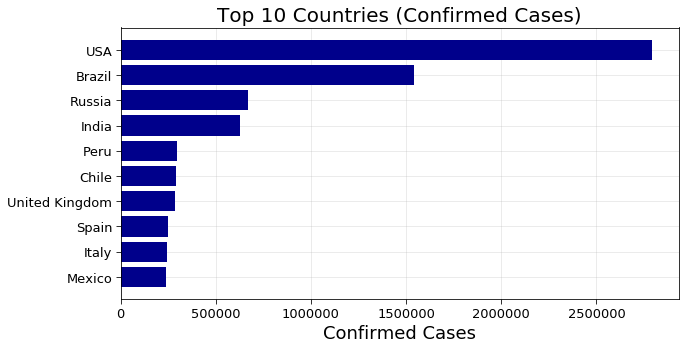

In [42]:
f = plt.figure(figsize = (10,5))
f.add_subplot(111)

plt.axes(axisbelow = True)
plt.barh(df_countries_cases.sort_values('Confirmed')["Confirmed"].index[-10:],\
         df_countries_cases.sort_values('Confirmed')["Confirmed"].values[-10:], color = "darkblue")

plt.tick_params(size = 5, labelsize = 13)
plt.xlabel("Confirmed Cases", fontsize = 18)
plt.title("Top 10 Countries (Confirmed Cases)", fontsize = 20)
plt.grid(alpha = 0.3)

plt.savefig(out + 'Top 10 Countries (Confirmed Cases).png')

### Death Cases

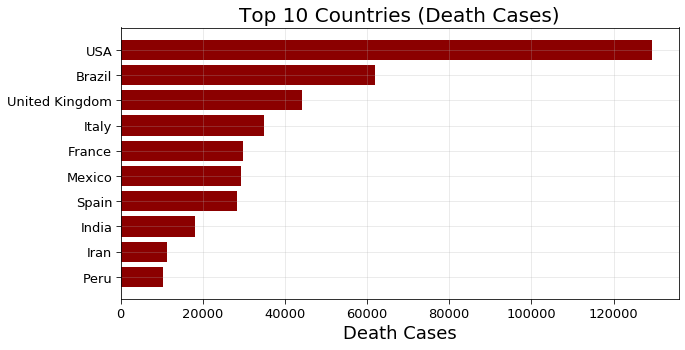

In [43]:
f = plt.figure(figsize = (10, 5))
f.add_subplot(111)

plt.axis(axisbelow = True)
plt.barh(df_countries_cases.sort_values('Deaths')["Deaths"].index[-10:],\
         df_countries_cases.sort_values('Deaths')["Deaths"].values[-10:], color = "darkred")

plt.tick_params(size = 5, labelsize = 13)
plt.xlabel("Death Cases", fontsize = 18)
plt.title("Top 10 Countries (Death Cases)", fontsize = 20)
plt.grid(alpha = 0.3)

plt.savefig(out + 'Top 10 Countries (Death Cases).png')

### Recovered Cases

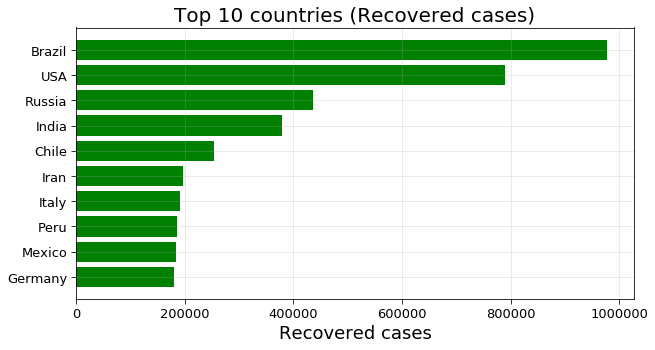

In [44]:
f = plt.figure(figsize = (10, 5))
f.add_subplot(111)

plt.axis(axisbelow = True)
plt.barh(df_countries_cases.sort_values('Recovered')['Recovered'].index[-10:],\
        df_countries_cases.sort_values('Recovered')['Recovered'].values[-10:], color = 'green')

plt.tick_params(size = 5, labelsize = 13)
plt.xlabel('Recovered cases', fontsize = 18)
plt.title('Top 10 countries (Recovered cases)', fontsize = 20)
plt.grid(alpha = 0.3)

#plt.savefig(out + 'Top 10 countries (Recovered cases).png')

### Active Cases

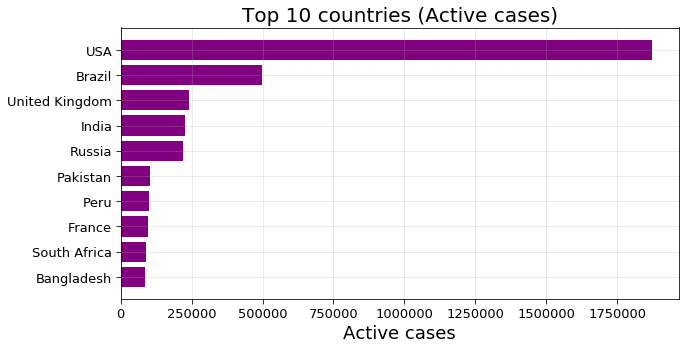

In [46]:
f = plt.figure(figsize = (10, 5))
f.add_subplot(111)

plt.axis(axisbelow = True)
plt.barh(df_countries_cases.sort_values('Active')['Active'].index[-10:],\
        df_countries_cases.sort_values('Active')['Active'].values[-10:], color = 'Purple')

plt.tick_params(size = 5, labelsize = 13)
plt.xlabel('Active cases', fontsize = 18)
plt.title('Top 10 countries (Active cases)', fontsize = 20)
plt.grid(alpha = 0.3)

plt.savefig(out + 'Top 10 countries (Active cases).png')

## Correlation Analysis

**Plotting Heat map of correlation of confirmed cases, recovered cases, deaths and active cases.**

### Continent wise correlation

In [47]:
df_continents_cases.iloc[:, :].corr().style.background_gradient(cmap = 'GnBu').format('{:.3f}')

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality Rate (per 100)
Confirmed,1.000,0.862,0.908,0.902,0.585,0.727
Deaths,0.862,1.000,0.703,0.818,0.578,0.952
Recovered,0.908,0.703,1.000,0.643,0.747,0.619
Active,0.902,0.818,0.643,1.000,0.275,0.640
Incident_Rate,0.585,0.578,0.747,0.275,1.000,0.626
Mortality Rate (per 100),0.727,0.952,0.619,0.640,0.626,1.000


### Country wise correlation

In [48]:
df_countries_cases.iloc[:, :].corr().style.background_gradient(cmap = 'GnBu').format('{:.3f}')

,Confirmed,Deaths,Recovered,Active,Incident_Rate,Mortality Rate (per 100)
Confirmed,1.000,0.929,0.908,0.953,0.222,0.091
Deaths,0.929,1.000,0.800,0.907,0.189,0.267
Recovered,0.908,0.800,1.000,0.739,0.265,0.079
Active,0.953,0.907,0.739,1.000,0.164,0.072
Incident_Rate,0.222,0.189,0.265,0.164,1.000,-0.004
Mortality Rate (per 100),0.091,0.267,0.079,0.072,-0.004,1.000


# Global Heatmap

## Confirmed cases

In [49]:
df_heat = pd.DataFrame(df_countries_cases['Confirmed'])
df_heat = df_heat.reset_index()

fig = px.choropleth(df_heat, locations = 'country', color = np.log10(df_heat['Confirmed']), hover_name = 'country', \
            hover_data = ['Confirmed'], color_continuous_scale = px.colors.sequential.Plasma, locationmode = 'country names')

fig.update_geos(fitbounds = 'locations', visible = False)
fig.update_layout(title_text = 'Confirmed Cases Heat Map (Log Scale)')
fig.update_coloraxes(colorbar_title = 'Confirmed Cases(Log Scale)', colorscale = 'blues')
fig.show()

## Death cases

In [50]:
df_heat = pd.DataFrame(df_countries_cases['Deaths'])
df_heat = df_heat.reset_index()

fig = px.choropleth(df_heat, locations = 'country', color = np.log10(df_heat['Deaths']), hover_name = 'country', \
                hover_data = ['Deaths'], color_continuous_scale = px.colors.sequential.Plasma, locationmode = 'country names')

fig.update_geos(fitbounds = 'locations', visible = False)
fig.update_layout(title_text = 'Death Cases Heat Map (Log Scale)')
fig.update_coloraxes(colorbar_title = 'Death cases (Log Scale)', colorscale = 'reds')
fig.show()

## Recovered cases

In [51]:
df_heat = pd.DataFrame(df_countries_cases['Recovered'])
df_heat = df_heat.reset_index()

fig = px.choropleth(df_heat, locations = 'country', color = np.log10(df_heat['Recovered']), hover_name = 'country', \
            hover_data = ['Recovered'], color_continuous_scale = px.colors.sequential.Plasma, locationmode = 'country names')

fig.update_geos(fitbounds = 'locations', visible = False)
fig.update_layout(title_text = 'Recovered Cases Heat Map (Log Scale)')
fig.update_coloraxes(colorbar_title = 'Recovered Cases (Log Scale)', colorscale = 'greens')
fig.show()

## Active cases

In [52]:
df_heat = pd.DataFrame(df_countries_cases['Active'])
df_heat = df_heat.reset_index()

fig = px.choropleth(df_heat, locations = 'country', color = np.log10(df_heat['Active']), hover_name = 'country',\
            hover_data = ['Active'], color_continuous_scale = px.colors.sequential.Plasma, locationmode = 'country names')

fig.update_geos(fitbounds = 'locations', visible = False)
fig.update_layout(title_text = 'Active Cases Heat Map (Log Scale)')
fig.update_coloraxes(colorbar_title = 'Active Cases (Log Scale)', colorscale = 'purples')
fig.show()

## Global map

In [53]:
world_map = folium.Map(location = [10, 0], tiles = "cartodbpositron", zoom_start = 2, max_zoom = 6, min_zoom = 2)
for i in range(0, len(df_confirmed)):
    folium.Circle(
        location = [df_confirmed.iloc[i]['Lat'], df_confirmed.iloc[i]['Long']],
        tooltip = "<h5 style='text-align:center;font-weight: bold'>" + df_confirmed.iloc[i]['country'] + "</h5>" +
                    "<div style='text-align:center;'>" + str(np.nan_to_num(df_confirmed.iloc[i]['state'])) + "</div>" +
                    "<hr style='margin:10px;'>" +
                    "<ul style='color: #444;list-style-type:circle;align-item:left;padding-left:20px;padding-right:20px'>"+
        "<li>Confirmed: "+str(df_confirmed.iloc[i,-1])+"</li>"+
        "<li>Deaths:   "+str(df_deaths.iloc[i,-1])+"</li>"+
        "<li>Mortality Rate:   "+str(np.round(df_deaths.iloc[i,-1]/(df_confirmed.iloc[i,-1]+1.00001)*100,2))+"</li>"+
        "</ul>"
        ,
        radius=(int((np.log(df_confirmed.iloc[i,-1]+1.00001)))+0.2)*50000,
        color='#200394',
        fill_color='#9bc0eb',
        fill=True).add_to(world_map)

world_map

## Spread Progression

In [54]:
df_data = df_table.groupby(['Last_Update', 'Country_Region'])['Confirmed', 'Deaths'].max().reset_index().fillna(0)
df_data["Last_Update"] = pd.to_datetime( df_data["Last_Update"]).dt.strftime('%m/%d/%Y')

fig = px.scatter_geo(df_data, locations = "Country_Region", locationmode = 'country names', 
                     color = np.power(df_data["Confirmed"], 0.3) - 2 , size = np.power(df_data["Confirmed"] + 1, 0.3) - 1,\
                     hover_name = "Country_Region", hover_data = ["Confirmed"],
                     range_color = [0, max(np.power(df_data["Confirmed"], 0.3))], 
                     projection = "natural earth", animation_frame = "Last_Update", 
                     color_continuous_scale = px.colors.sequential.Plasma,
                     title = 'COVID-19: Progression of spread'
                    )
fig.update_coloraxes(colorscale = "hot")
fig.update(layout_coloraxis_showscale = False)
fig.show()

## Number of countries affected over the time

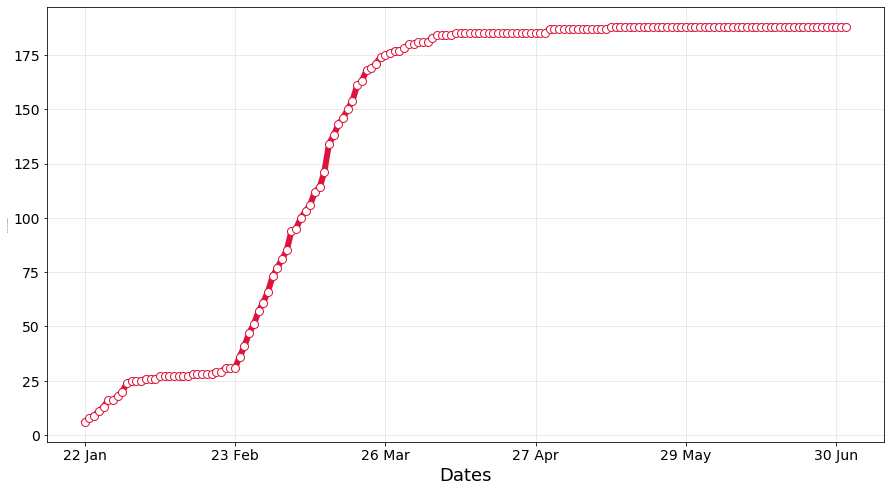

In [55]:
case_nums_country = df_confirmed.groupby("country").sum().drop(['Lat','Long'],axis = 1).apply(lambda x: x[x > 0].count(),\
                                                                                              axis = 0)
d = [datetime.strptime(date,'%m/%d/%y').strftime("%d %b") for date in case_nums_country.index]

f = plt.figure(figsize = (15,8))
f.add_subplot(111)
marker_style = dict(c = "crimson", linewidth = 6, linestyle = '-', marker = 'o', markersize = 8, markerfacecolor = '#ffffff')
plt.plot(d, case_nums_country, **marker_style)
plt.tick_params(labelsize = 14)
plt.xticks(list(np.arange(0, len(d), int(len(d) / 5))), d[:-1:int(len(d) / 5)] + [d[-1]])

#labels
plt.xlabel("Dates",fontsize = 18)
plt.ylabel("Number of Countries/Regions", fontsize = 1)
plt.grid(alpha = 0.3)

plt.savefig(out + 'spread.png')
plt.show()
plt.close()

## Global spread trends

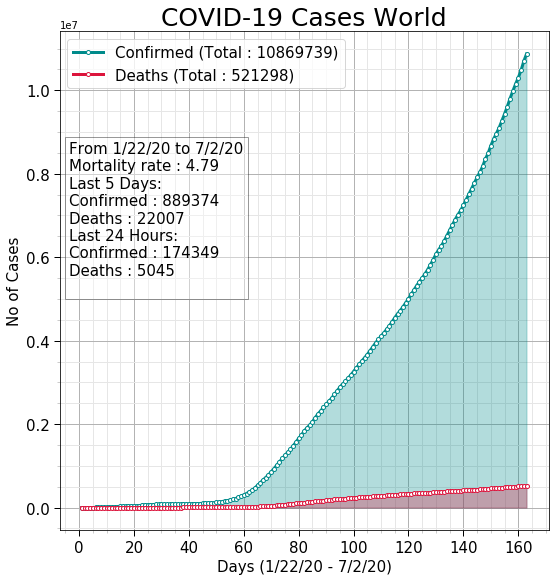

In [56]:
cols = 1
rows = 1
f = plt.figure(figsize = (10, 10 * rows))

visualize_covid_cases(df_confirmed, df_deaths, continent = "All",figure = [f, rows, cols, 1])

plt.savefig(out + 'COIVD-19-World.png')
plt.show()

## Spread Comparison of few most affected countries

### Confirmed cases

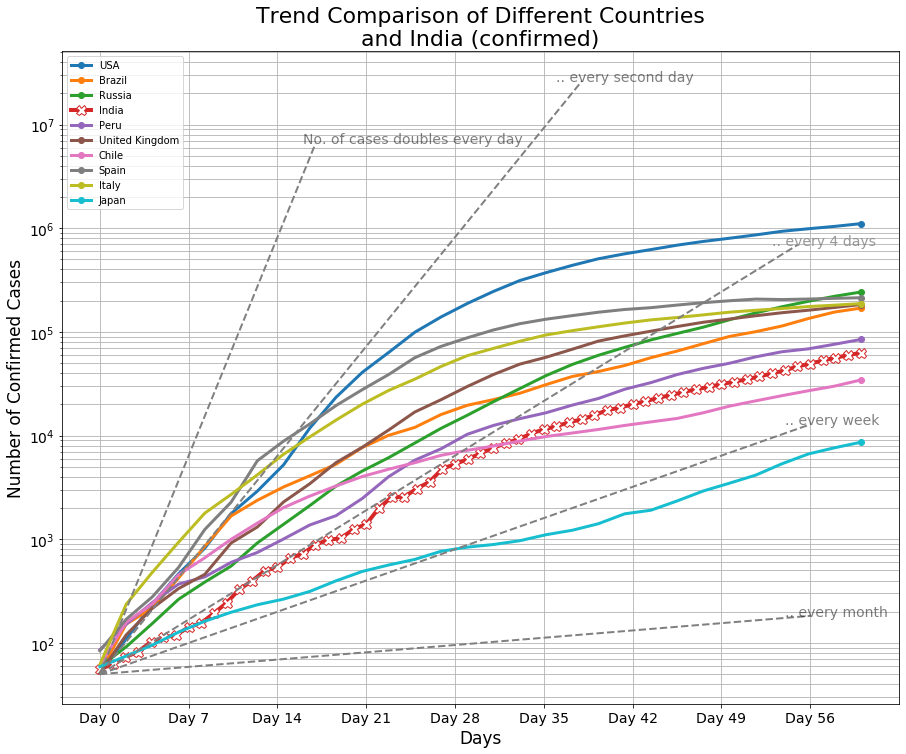

In [57]:
temp = df_confirmed.groupby('country').sum().drop(["Lat","Long"],axis = 1).sort_values(df_confirmed.columns[-1], ascending = False)

threshold = 50
f = plt.figure(figsize = (15, 12))
ax = f.add_subplot(111)
for i, country in enumerate(temp.index):
    if i >= 9:
        if country != "India" and country != "Japan" :
            continue
    days = 61
    t = temp.loc[temp.index == country].values[0]
    t = t[t > threshold][:days]
     
    date = np.arange(0, len(t[:days]))
    xnew = np.linspace(date.min(), date.max(), 30)
    spl = make_interp_spline(date, t, k = 1)  # type: BSpline
    power_smooth = spl(xnew)
    if country != "India":
        plt.plot(xnew,power_smooth,'-o',label = country, linewidth = 3, markevery = [-1])
    else:
        marker_style = dict(linewidth = 4, linestyle = '-', marker = 'X',markersize = 10, markerfacecolor = '#ffffff')
        plt.plot(date,t,"-.",label = country,**marker_style)
        
plt.tick_params(labelsize = 14)        
plt.xticks(np.arange(0,days,7),[ "Day "+str(i) for i in range(days)][::7])     

# Reference lines 
x = np.arange(0,18)
y = 2**(x+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("No. of cases doubles every day",(x[-2],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,int(days-22))
y = 2**(x/2+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every second day",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,int(days-4))
y = 2**(x/7+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every week",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,int(days-4))
y = 2**(x/30+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every month",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

# India is following trend similar to double the cases in 4 days but it may increase the rate 
x = np.arange(0,int(days-5))
y = 2**(x/4+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every 4 days",(x[-3],y[-1]),color="gray",xycoords="data",fontsize=14,alpha = 0.8)

# plot Params
plt.xlabel("Days",fontsize=17)
plt.ylabel("Number of Confirmed Cases",fontsize=17)
plt.title("Trend Comparison of Different Countries\n and India (confirmed) ",fontsize=22)
plt.legend(loc = "upper left")
plt.yscale("log")
plt.grid(which="both")
plt.savefig(out+'Trend Comparison with India (confirmed).png')
plt.show()

### Death cases

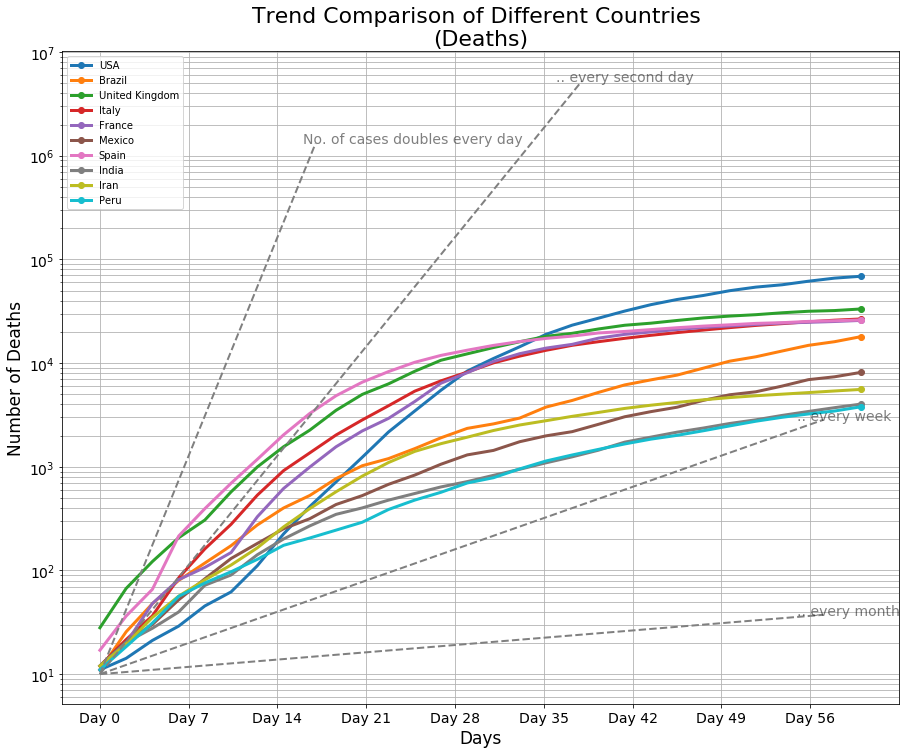

In [67]:
temp = df_deaths.groupby('country').sum().drop(["Lat","Long"],axis =1).sort_values(df_deaths.columns[-1], ascending= False)

threshold = 10
f = plt.figure(figsize=(15,12))
ax = f.add_subplot(111)
for i,country in enumerate(temp.index):
    if i >= 10:
        break
    days = 61
    t = temp.loc[temp.index == country].values[0]
    t = t[t>threshold][:days]
     
    date = np.arange(0,len(t[:days]))
    xnew = np.linspace(date.min(), date.max(), 30)
    spl = make_interp_spline(date, t, k=1)  # type: BSpline
    power_smooth = spl(xnew)
    plt.plot(xnew,power_smooth,'-o',label = country,linewidth =3, markevery=[-1])


plt.tick_params(labelsize = 14)        
plt.xticks(np.arange(0,days,7),[ "Day "+str(i) for i in range(days)][::7])

# Reference lines 
x = np.arange(0,18)
y = 2**(x+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate("No. of cases doubles every day",(x[-2],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days-22)
y = 2**(x/2+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every second day",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days-3)
y = 2**(x/7+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every week",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

x = np.arange(0,days-3)
y = 2**(x/30+np.log2(threshold))
plt.plot(x,y,"--",linewidth =2,color = "gray")
plt.annotate(".. every month",(x[-3],y[-1]),xycoords="data",fontsize=14,alpha = 0.5)

# plot Params
plt.xlabel("Days",fontsize=17)
plt.ylabel("Number of Deaths",fontsize=17)
plt.title("Trend Comparison of Different Countries \n(Deaths)",fontsize=22)
plt.legend(loc = "upper left")
plt.yscale("log")
plt.grid(which="both")
plt.savefig(out+'Trend Comparison countries deaths.png')
plt.show()

## Recovered cases

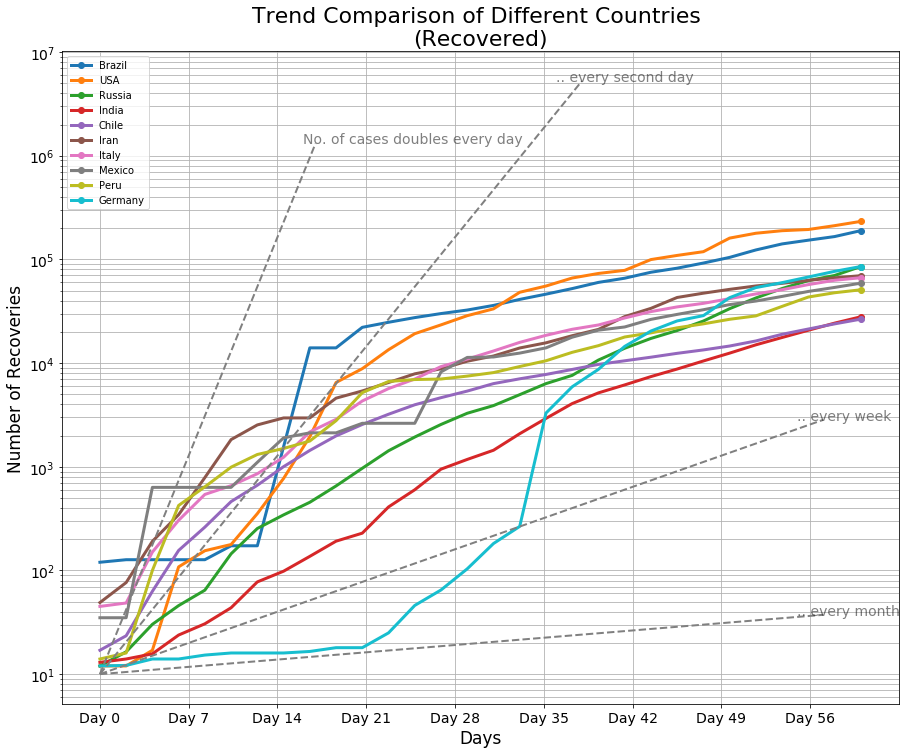

In [59]:
temp = df_recovered.groupby('country').sum().drop(["Lat", "Long"],axis = 1).sort_values(df_recovered.columns[-1], ascending = False)

threshold = 10
f = plt.figure(figsize = (15, 12))
ax = f.add_subplot(111)
for i,country in enumerate(temp.index):
    if i >= 10:
        break
    days = 61
    t = temp.loc[temp.index == country].values[0]
    t = t[t > threshold][:days]
     
    date = np.arange(0, len(t[:days]))
    xnew = np.linspace(date.min(), date.max(), 30)
    spl = make_interp_spline(date, t, k = 1)  # type: BSpline
    power_smooth = spl(xnew)
    plt.plot(xnew, power_smooth, '-o', label = country, linewidth = 3, markevery = [-1])

plt.tick_params(labelsize = 14)        
plt.xticks(np.arange(0, days, 7),[ "Day " + str(i) for i in range(days)][::7])

# Reference lines 
x = np.arange(0,18)
y = 2 ** (x + np.log2(threshold))
plt.plot(x, y, "--", linewidth = 2, color = "gray")
plt.annotate("No. of cases doubles every day",(x[-2], y[-1]), xycoords = "data", fontsize = 14, alpha = 0.5)

x = np.arange(0, days-22)
y = 2 ** (x / 2 + np.log2(threshold))
plt.plot(x,y,"--",linewidth = 2, color = "gray")
plt.annotate(".. every second day", (x[-3], y[-1]), xycoords = "data", fontsize = 14, alpha = 0.5)

x = np.arange(0, days-3)
y = 2 ** (x / 7 + np.log2(threshold))
plt.plot(x, y,"--",linewidth = 2, color = "gray")
plt.annotate(".. every week",(x[-3], y[-1]), xycoords = "data", fontsize = 14, alpha = 0.5)

x = np.arange(0, days-3)
y = 2 ** (x / 30 + np.log2(threshold))
plt.plot(x, y, "--", linewidth = 2, color = "gray")
plt.annotate(".. every month",(x[-3], y[-1]), xycoords = "data", fontsize = 14, alpha = 0.5)

# plot Params
plt.xlabel("Days", fontsize = 17)
plt.ylabel("Number of Recoveries", fontsize = 17)
plt.title("Trend Comparison of Different Countries \n(Recovered)", fontsize = 22)
plt.legend(loc = "upper left")
plt.yscale("log")
plt.grid(which = "both")
#plt.savefig(out + 'Trend Comparison countries recovered.png')
plt.show()

## Global analysis on a daily basis

### Confirmed cases

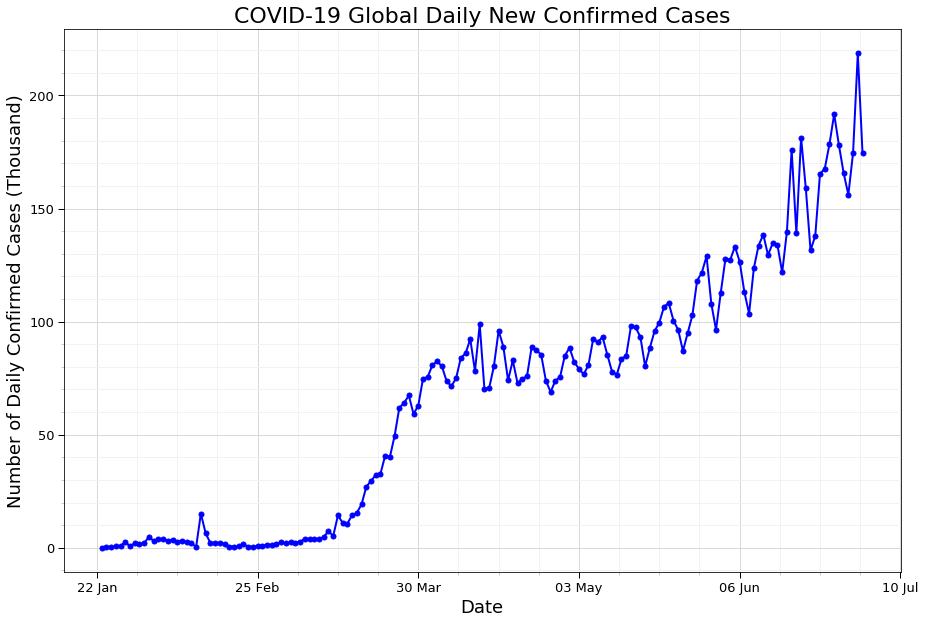

In [68]:
thousand = 1000
prediction_days = 10

temp_data = np.nan_to_num(df_confirmed.sum()[5:].diff())


# Plot
f = plt.figure(figsize=(15,10))
ax = f.add_subplot(111)


date = np.arange(0,len(temp_data))

marker_style = dict(linewidth=2, linestyle='-', marker='o',markersize=5)
plt.plot(date,temp_data/thousand, "-.",color="blue",**marker_style)

nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)]+[total[-1]])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=12)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.85", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.95", which = 'minor')

# Plot Title
plt.title("COVID-19 Global Daily New Confirmed Cases",{'fontsize':22})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Daily Confirmed Cases (Thousand)",fontsize =18)

# plt.yscale("log")
plt.tick_params(labelsize = 13) 
plt.savefig(out+"daily confirmed cases global.png")
plt.show()

### Death cases

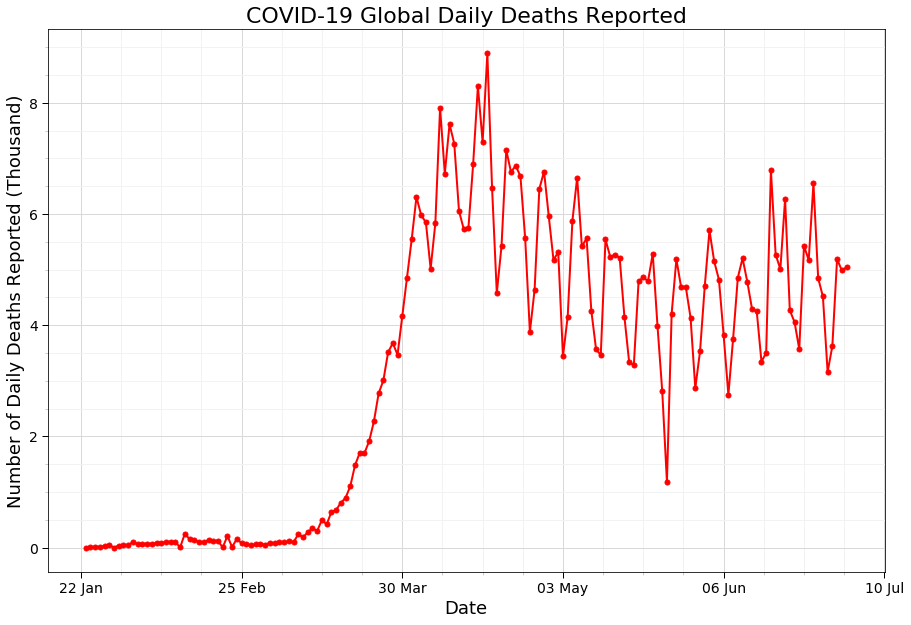

In [69]:
temp_data = np.nan_to_num(df_deaths.sum()[5:].diff())


# Plot
f = plt.figure(figsize=(15,10))
ax = f.add_subplot(111)


date = np.arange(0,len(temp_data))

marker_style = dict(linewidth=2, linestyle='-', marker='o',markersize=5)
plt.plot(date,temp_data/thousand,"-.",color="red",**marker_style)


nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)]+[total[-1]])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=14)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.85", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.95", which = 'minor')

# Plot Title
plt.title("COVID-19 Global Daily Deaths Reported",{'fontsize':22})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Daily Deaths Reported (Thousand)",fontsize =18)

# plt.yscale("log")
plt.savefig(out+"daily deaths cases Global.png")
plt.show()

### Recovered cases

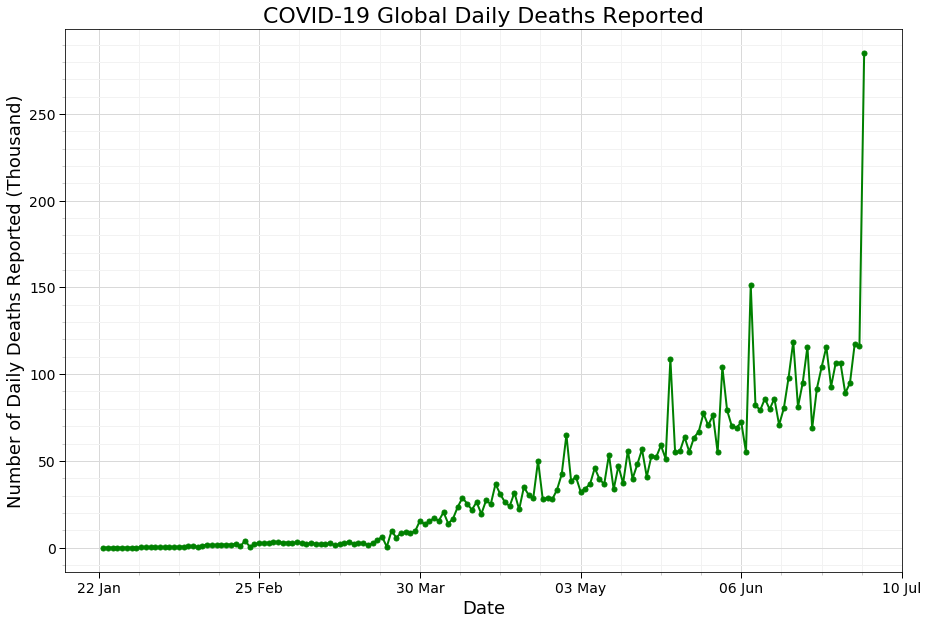

In [70]:
temp_data = np.nan_to_num(df_recovered.sum()[5:].diff())


# Plot
f = plt.figure(figsize=(15,10))
ax = f.add_subplot(111)


date = np.arange(0,len(temp_data))

marker_style = dict(linewidth=2, linestyle='-', marker='o',markersize=5)
plt.plot(date,temp_data/thousand,"-.",color="green",**marker_style)


nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)]+[total[-1]])

# Tick-Parameters
ax.xaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.yaxis.set_minor_locator(ticker.AutoMinorLocator())
ax.tick_params(which='both', width=1,labelsize=14)
ax.tick_params(which='major', length=6)
ax.tick_params(which='minor', length=3, color='0.8')

# Grid
plt.grid(lw = 1, ls = '-', c = "0.85", which = 'major')
plt.grid(lw = 1, ls = '-', c = "0.95", which = 'minor')

# Plot Title
plt.title("COVID-19 Global Daily Deaths Reported",{'fontsize':22})

# Axis Lable
plt.xlabel("Date",fontsize =18)
plt.ylabel("Number of Daily Deaths Reported (Thousand)",fontsize =18)

# plt.yscale("log")
plt.savefig(out+"daily deaths cases Global.png")
plt.show()

## Mortality Rate Variation Over Period of Time

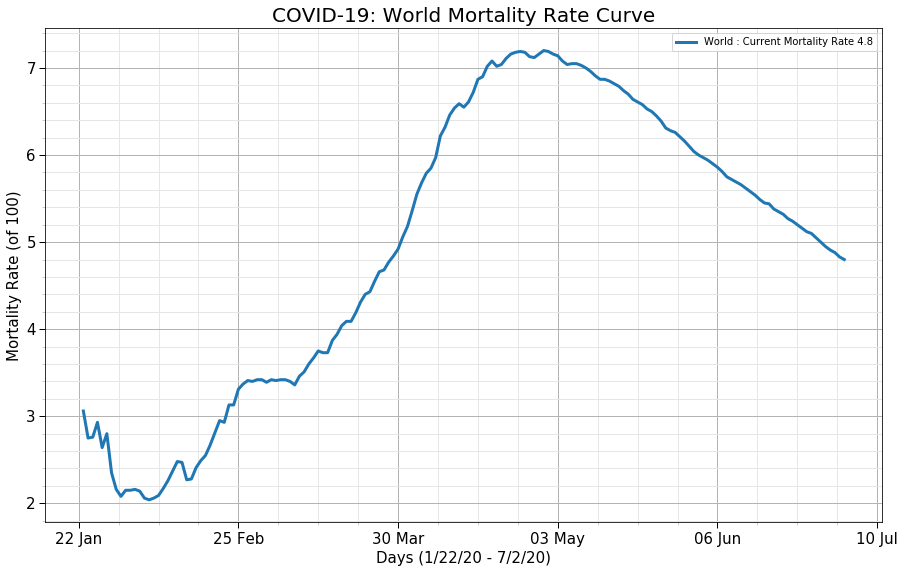

In [71]:
df_continents= df_confirmed.groupby(["continent"]).sum()
continents = df_continents.sort_values(df_continents.columns[-1],ascending = False).index
continents = ["All"]+list(continents)

cols =1
rows = 2
axis_label = ["Days ("+df_confirmed.columns[5]+" - "+df_confirmed.columns[-1]+")","Mortality Rate (of 100)"]

f = plt.figure(figsize=(15,10*rows))

ax = f.add_subplot(211)
mortality_rate = get_mortality_rate(df_confirmed,df_deaths,continent=continents[0])
plt.plot(np.arange(1,mortality_rate.shape[0]+1),mortality_rate,label = "World : Current Mortality Rate "+str(mortality_rate[-1]),linewidth=3)

nextdays = [(datetime.strptime(d[-1],'%d %b')+timedelta(days=i)).strftime("%d %b") for i in range(1,prediction_days+1)]
total =d+nextdays

# X-axis
plt.xticks(list(np.arange(0,len(total),int(len(total)/5))),total[:-1:int(len(total)/5)]+[total[-1]])

plt_title = "COVID-19: World Mortality Rate Curve"
plot_params(ax,axis_label,plt_title)
# Legend Location
l = plt.legend(loc= "best")

## Comparing China with the rest of the world in the first 60 days

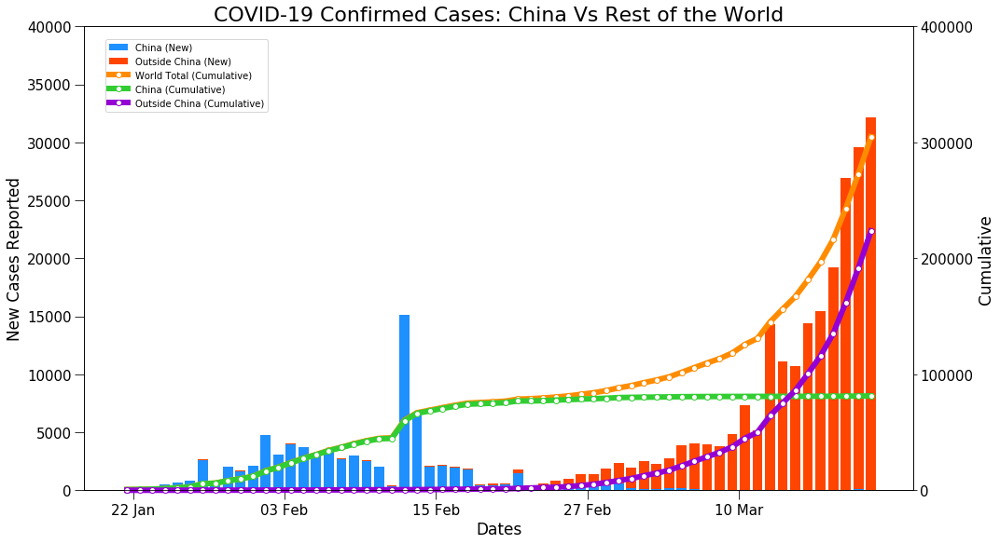

In [72]:
# Getting data for China and Oouside China
# df - Cumulative data for china, outside china and world total  (confirmed cases)
# df_newcases- new cases reported per day  (confirmed cases)
df_confirmed_report = df_confirmed.iloc[:,:65].copy()
df_confirmed_report.loc[df_confirmed_report['country'] != "China","country"] = "Outside China"
df_confirmed_report = df_confirmed_report.groupby("country").sum().drop(["Lat","Long"],axis =1)
df_confirmed_report.loc["Total"] = df_confirmed_report.sum()
df_confirmed_newcases = df_confirmed_report.groupby(level =0).diff(axis =1)
df_confirmed_newcases = df_confirmed_newcases.replace(np.nan, 0, regex=True) 
f = plt.figure(figsize=(15,8))
ax1 = f.add_subplot(111)

ax1.bar(df_confirmed_report[df_confirmed_report.index == "China"].columns,df_confirmed_newcases[df_confirmed_newcases.index == "China"].values[0], label = "China (New)",color='dodgerblue')
ax1.bar(df_confirmed_report[df_confirmed_report.index == "Outside China"].columns,df_confirmed_newcases[df_confirmed_newcases.index == "Outside China"].values[0],bottom=df_confirmed_newcases[df_confirmed_newcases.index == "China"].values[0],label = "Outside China (New)",color='orangered')

# Labels
ax1.set_xlabel("Dates",fontsize=17)
ax1.set_ylabel("New Cases Reported",fontsize =17)

ax1.tick_params(size=10,labelsize=15)
length = len(df_confirmed_report.columns)
ax1.set_xticks(np.arange(0.5, length, int(length/5)))
ax1.set_xticklabels([datetime.strptime(date,'%m/%d/%y').strftime("%d %b") for date in df_confirmed_report.columns][::int(length/5)],fontsize=15)
l = np.arange(0, df_confirmed_report.max(axis = 1)[2]/10+10000, 5000)
ax1.set_yticks(l[::int(len(l)/5)])
# ax1.spines['bottom'].set_position('zero')

ax2 = ax1.twinx()
marker_style = dict(linewidth=6, linestyle='-', marker='o',markersize=6, markerfacecolor='#ffffff')

ax2.plot(df_confirmed_report[df_confirmed_report.index == "Total"].columns ,df_confirmed_report[df_confirmed_report.index == "Total"].values[0],**marker_style,label = "World Total (Cumulative)",color="darkorange",clip_on=False)
ax2.plot(df_confirmed_report[df_confirmed_report.index == "China"].columns ,df_confirmed_report[df_confirmed_report.index == "China"].values[0],**marker_style,label = "China (Cumulative)",color="limegreen",clip_on=False)
ax2.plot(df_confirmed_report[df_confirmed_report.index == "Outside China"].columns ,df_confirmed_report[df_confirmed_report.index == "Outside China"].values[0],**marker_style,label ="Outside China (Cumulative)",color="darkviolet",clip_on=False)
ax2.bar([0],[0])

# Label
ax2.tick_params(labelsize=15)
ax2.set_ylabel("Cumulative",fontsize =17)
ax2.set_xticks(np.arange(0.5, length, int(length/5)))
ax2.set_xticklabels([datetime.strptime(date,'%m/%d/%y').strftime("%d %b") for date in df_confirmed_report.columns][::int(length/5)],fontsize=15)
l = np.arange(0, df_confirmed_report.max(axis = 1)[2]+100000, 100000)
ax2.set_yticks(l[::int(len(l)/5)])

f.tight_layout()
f.legend(loc = "upper left", bbox_to_anchor=(0.1,0.95))
plt.title("COVID-19 Confirmed Cases: China Vs Rest of the World",fontsize = 22)
plt.savefig(out+'China vs Rest of the world.png')
plt.show()